In [ ]:
用老师给的代码下载数据zip别慢，我后来直接在网上找的链接下载的

# 加载和归一化图像数据
该代码块主要实现了3个功能：
1：将本地硬盘中的每类图像文件夹中的图像数据读到一个3维的dataset对象中，第1维是图像个数索引，其余2维则是图像数据。其中主要是利用了scipy模块中的ndarray对象兑取硬盘中的图像数据。
2：将读取到的图像数据按照上文所述的公式进行了归一化。
3：将ndarray对象打包为pickle格式并存储在工作目录下，每个类别有一个.pickle文件。并将打包后.pickle文件的地址存储为train_datasets和test_datasets返回。
注：将数据打包为.pickle文件更便于数据的调用与处理。因为，图像的原始数据是使用循环打入到对象中的，如果每次使用图像数据均需要循环来加载，这样加大了代码量。而对.pickle文件只需要读取一次即可，而无需使用循环。

In [6]:
from __future__ import print_function
import imageio
import matplotlib.pyplot as plt
import numpy as np
import os
import sys
import tarfile
from IPython.display import display, Image
from sklearn.linear_model import LogisticRegression
from six.moves.urllib.request import urlretrieve
from six.moves import cPickle as pickle


image_size = 28  # Pixel width and height.
pixel_depth = 255.0  # Number of levels per pixel.
data_root= "G:/github/lesson9/data/" 

def load_letter(folder, min_num_images):
    """Load the data for a single letter label."""
    image_files = os.listdir(folder)
    dataset = np.ndarray(shape=(len(image_files), image_size, image_size),
                         dtype=np.float32)
    print("folder=",folder)
    print("image_files",image_files)
    num_images = 0
    for image in image_files:
        image_file = os.path.join(folder, image)
        try:
            image_data = (imageio.imread(image_file).astype(float) -
                          pixel_depth / 2) / pixel_depth
            if image_data.shape != (image_size, image_size):
                raise Exception('Unexpected image shape: %s' % str(image_data.shape))
            dataset[num_images, :, :] = image_data
            num_images = num_images + 1
        except (IOError, ValueError) as e:
            print('Could not read:', image_file, ':', e, '- it\'s ok, skipping.')

    dataset = dataset[0:num_images, :, :]
    if num_images < min_num_images:
        raise Exception('Many fewer images than expected: %d < %d' %
                        (num_images, min_num_images))

    print('Full dataset tensor:', dataset.shape)
    print('Mean:', np.mean(dataset))#均值
    print('Standard deviation:', np.std(dataset))#标准差
    return dataset


def maybe_pickle(data_folders, min_num_images_per_class, force=False):
    dataset_names = []
    for folder in data_folders:
        folder = data_root + folder
        set_filename = folder + '.pickle'
        dataset_names.append(set_filename)
        if os.path.exists(set_filename) and not force:
            # You may override by setting force=True.
            print('%s already present - Skipping pickling.' % set_filename)
        else:
            print('Pickling %s.' % set_filename)
            dataset = load_letter(folder, min_num_images_per_class)
            try:
                with open(set_filename, 'wb') as f:
                    pickle.dump(dataset, f, pickle.HIGHEST_PROTOCOL)
            except Exception as e:
                print('Unable to save data to', set_filename, ':', e)

    return dataset_names

train_forders = ['notMNIST_large/A', 'notMNIST_large/B', 'notMNIST_large/C', 'notMNIST_large/D', 'notMNIST_large/E', 'notMNIST_large/F', 'notMNIST_large/G', 'notMNIST_large/H', 'notMNIST_large/I', 'notMNIST_large/J']
test_forders = ['notMNIST_small/A', 'notMNIST_small/B', 'notMNIST_small/C', 'notMNIST_small/D', 'notMNIST_small/E', 'notMNIST_small/F', 'notMNIST_small/G', 'notMNIST_small/H', 'notMNIST_small/I', 'notMNIST_small/J']
train_datasets = maybe_pickle( train_forders, 45000)
test_datasets = maybe_pickle(test_forders, 1800)

Pickling G:/github/lesson9/data/notMNIST_large/A.pickle.
folder= G:/github/lesson9/data/notMNIST_large/A
image_files ['a29ydW5pc2hpLnR0Zg==.png', 'a2F6b28udHRm.png', 'a2FkZW4udHRm.png', 'a2FpcmVlLnR0Zg==.png', 'a2Fua2FuYSBLLnR0Zg==.png', 'a2FuIEUudHRm.png', 'a2hhcm9uNGFfbWluaS50dGY=.png', 'a2l0Y2hlbiB0aWxlLnR0Zg==.png', 'a2ltaWRvcmkgbXVnY3VwLnR0Zg==.png', 'a2VhZ2FuLnR0Zg==.png', 'a2VtaWthbEhpLnR0Zg==.png', 'a2xvenpiYXRzLnR0Zg==.png', 'a3JvZWdlciAwNF81Ni50dGY=.png', 'a3JvZWdlciAwNF81NS50dGY=.png', 'a3JvZWdlciAwNF82Ni50dGY=.png', 'a3JvZWdlciAwNF82NS50dGY=.png', 'a3JvZWdlciAwNl81Ni50dGY=.png', 'a3JvZWdlciAwNl81NS50dGY=.png', 'a3JvZWdlciAwNl82My50dGY=.png', 'a3JvZWdlciAwNl82NC50dGY=.png', 'a3JvZWdlciAwNl82Ni50dGY=.png', 'a3JvZWdlciAwNl82NS50dGY=.png', 'a3JvZWdlciAwNV81My50dGY=.png', 'a3JvZWdlciAwNV81NC50dGY=.png', 'a3JvZWdlciAwNV81Ni50dGY=.png', 'a3JvZWdlciAwNV81NS50dGY=.png', 'a3JvZWdlciAwNV81Ny50dGY=.png', 'a3JvZWdlciAwNV81OC50dGY=.png', 'a3JvZWdlciAwNV82My50dGY=.png', 'a3JvZWdlciAwNV82N

Could not read: G:/github/lesson9/data/notMNIST_large/A\RnJlaWdodERpc3BCb29rSXRhbGljLnR0Zg==.png : Could not find a format to read the specified file in mode 'i' - it's ok, skipping.
Could not read: G:/github/lesson9/data/notMNIST_large/A\SG90IE11c3RhcmQgQlROIFBvc3Rlci50dGY=.png : Could not find a format to read the specified file in mode 'i' - it's ok, skipping.
Could not read: G:/github/lesson9/data/notMNIST_large/A\Um9tYW5hIEJvbGQucGZi.png : Could not find a format to read the specified file in mode 'i' - it's ok, skipping.
Full dataset tensor: (52909, 28, 28)
Mean: -0.12825024
Standard deviation: 0.44312063
Pickling G:/github/lesson9/data/notMNIST_large/B.pickle.
folder= G:/github/lesson9/data/notMNIST_large/B
image_files ['a29ydW5pc2hpLnR0Zg==.png', 'a2F6b28udHRm.png', 'a2FkZW4udHRm.png', 'a2FpcmVlLnR0Zg==.png', 'a2Fua2FuYSBLLnR0Zg==.png', 'a2FuIEUudHRm.png', 'a2hhcm9uNGFfbWluaS50dGY=.png', 'a2l0Y2hlbiB0aWxlLnR0Zg==.png', 'a2ltaWRvcmkgbXVnY3VwLnR0Zg==.png', 'a2VhZ2FuLnR0Zg==.png',

Could not read: G:/github/lesson9/data/notMNIST_large/B\TmlraXNFRi1TZW1pQm9sZEl0YWxpYy5vdGY=.png : Could not find a format to read the specified file in mode 'i' - it's ok, skipping.
Full dataset tensor: (52911, 28, 28)
Mean: -0.0075630303
Standard deviation: 0.45449105
Pickling G:/github/lesson9/data/notMNIST_large/C.pickle.
folder= G:/github/lesson9/data/notMNIST_large/C
image_files ['a29ydW5pc2hpLnR0Zg==.png', 'a2F6b28udHRm.png', 'a2FkZW4udHRm.png', 'a2FpcmVlLnR0Zg==.png', 'a2Fua2FuYSBLLnR0Zg==.png', 'a2FuIEUudHRm.png', 'a2hhcm9uNGFfbWluaS50dGY=.png', 'a2l0Y2hlbiB0aWxlLnR0Zg==.png', 'a2ltaWRvcmkgbXVnY3VwLnR0Zg==.png', 'a2VhZ2FuLnR0Zg==.png', 'a2VtaWthbEhpLnR0Zg==.png', 'a2xvenpiYXRzLnR0Zg==.png', 'a3JvZWdlciAwNF81Ni50dGY=.png', 'a3JvZWdlciAwNF81NS50dGY=.png', 'a3JvZWdlciAwNF82Ni50dGY=.png', 'a3JvZWdlciAwNF82NS50dGY=.png', 'a3JvZWdlciAwNl81Ni50dGY=.png', 'a3JvZWdlciAwNl81NS50dGY=.png', 'a3JvZWdlciAwNl82My50dGY=.png', 'a3JvZWdlciAwNl82NC50dGY=.png', 'a3JvZWdlciAwNl82Ni50dGY=.png', 'a3

Full dataset tensor: (52912, 28, 28)
Mean: -0.14225811
Standard deviation: 0.43980625
Pickling G:/github/lesson9/data/notMNIST_large/D.pickle.
folder= G:/github/lesson9/data/notMNIST_large/D
image_files ['a29ydW5pc2hpLnR0Zg==.png', 'a2F6b28udHRm.png', 'a2FkZW4udHRm.png', 'a2FpcmVlLnR0Zg==.png', 'a2Fua2FuYSBLLnR0Zg==.png', 'a2FuIEUudHRm.png', 'a2hhcm9uNGFfbWluaS50dGY=.png', 'a2l0Y2hlbiB0aWxlLnR0Zg==.png', 'a2ltaWRvcmkgbXVnY3VwLnR0Zg==.png', 'a2VhZ2FuLnR0Zg==.png', 'a2VtaWthbEhpLnR0Zg==.png', 'a2xvenpiYXRzLnR0Zg==.png', 'a3JvZWdlciAwNF81Ni50dGY=.png', 'a3JvZWdlciAwNF81NS50dGY=.png', 'a3JvZWdlciAwNF82Ni50dGY=.png', 'a3JvZWdlciAwNF82NS50dGY=.png', 'a3JvZWdlciAwNl81Ni50dGY=.png', 'a3JvZWdlciAwNl81NS50dGY=.png', 'a3JvZWdlciAwNl82My50dGY=.png', 'a3JvZWdlciAwNl82NC50dGY=.png', 'a3JvZWdlciAwNl82Ni50dGY=.png', 'a3JvZWdlciAwNl82NS50dGY=.png', 'a3JvZWdlciAwNV81My50dGY=.png', 'a3JvZWdlciAwNV81NC50dGY=.png', 'a3JvZWdlciAwNV81Ni50dGY=.png', 'a3JvZWdlciAwNV81NS50dGY=.png', 'a3JvZWdlciAwNV81Ny50dGY=.pn

Could not read: G:/github/lesson9/data/notMNIST_large/D\VHJhbnNpdCBCb2xkLnR0Zg==.png : Could not find a format to read the specified file in mode 'i' - it's ok, skipping.
Full dataset tensor: (52911, 28, 28)
Mean: -0.057367794
Standard deviation: 0.45564765
Pickling G:/github/lesson9/data/notMNIST_large/E.pickle.
folder= G:/github/lesson9/data/notMNIST_large/E
image_files ['a29ydW5pc2hpLnR0Zg==.png', 'a2F6b28udHRm.png', 'a2FkZW4udHRm.png', 'a2FpcmVlLnR0Zg==.png', 'a2Fua2FuYSBLLnR0Zg==.png', 'a2FuIEUudHRm.png', 'a2hhcm9uNGFfbWluaS50dGY=.png', 'a2l0Y2hlbiB0aWxlLnR0Zg==.png', 'a2ltaWRvcmkgbXVnY3VwLnR0Zg==.png', 'a2VhZ2FuLnR0Zg==.png', 'a2VtaWthbEhpLnR0Zg==.png', 'a2xvenpiYXRzLnR0Zg==.png', 'a3JvZWdlciAwNF81Ni50dGY=.png', 'a3JvZWdlciAwNF81NS50dGY=.png', 'a3JvZWdlciAwNF82Ni50dGY=.png', 'a3JvZWdlciAwNF82NS50dGY=.png', 'a3JvZWdlciAwNl81Ni50dGY=.png', 'a3JvZWdlciAwNl81NS50dGY=.png', 'a3JvZWdlciAwNl82My50dGY=.png', 'a3JvZWdlciAwNl82NC50dGY=.png', 'a3JvZWdlciAwNl82Ni50dGY=.png', 'a3JvZWdlciAwNl8

Full dataset tensor: (52912, 28, 28)
Mean: -0.06989899
Standard deviation: 0.45294195
Pickling G:/github/lesson9/data/notMNIST_large/F.pickle.
folder= G:/github/lesson9/data/notMNIST_large/F
image_files ['a29ydW5pc2hpLnR0Zg==.png', 'a2F6b28udHRm.png', 'a2FkZW4udHRm.png', 'a2FpcmVlLnR0Zg==.png', 'a2Fua2FuYSBLLnR0Zg==.png', 'a2FuIEUudHRm.png', 'a2hhcm9uNGFfbWluaS50dGY=.png', 'a2l0Y2hlbiB0aWxlLnR0Zg==.png', 'a2ltaWRvcmkgbXVnY3VwLnR0Zg==.png', 'a2VhZ2FuLnR0Zg==.png', 'a2VtaWthbEhpLnR0Zg==.png', 'a2xvenpiYXRzLnR0Zg==.png', 'a3JvZWdlciAwNF81Ni50dGY=.png', 'a3JvZWdlciAwNF81NS50dGY=.png', 'a3JvZWdlciAwNF82Ni50dGY=.png', 'a3JvZWdlciAwNF82NS50dGY=.png', 'a3JvZWdlciAwNl81Ni50dGY=.png', 'a3JvZWdlciAwNl81NS50dGY=.png', 'a3JvZWdlciAwNl82My50dGY=.png', 'a3JvZWdlciAwNl82NC50dGY=.png', 'a3JvZWdlciAwNl82Ni50dGY=.png', 'a3JvZWdlciAwNl82NS50dGY=.png', 'a3JvZWdlciAwNV81My50dGY=.png', 'a3JvZWdlciAwNV81NC50dGY=.png', 'a3JvZWdlciAwNV81Ni50dGY=.png', 'a3JvZWdlciAwNV81NS50dGY=.png', 'a3JvZWdlciAwNV81Ny50dGY=.pn

Full dataset tensor: (52912, 28, 28)
Mean: -0.1255833
Standard deviation: 0.44708964
Pickling G:/github/lesson9/data/notMNIST_large/G.pickle.
folder= G:/github/lesson9/data/notMNIST_large/G
image_files ['a29ydW5pc2hpLnR0Zg==.png', 'a2F6b28udHRm.png', 'a2FkZW4udHRm.png', 'a2FpcmVlLnR0Zg==.png', 'a2Fua2FuYSBLLnR0Zg==.png', 'a2FuIEUudHRm.png', 'a2hhcm9uNGFfbWluaS50dGY=.png', 'a2l0Y2hlbiB0aWxlLnR0Zg==.png', 'a2ltaWRvcmkgbXVnY3VwLnR0Zg==.png', 'a2VhZ2FuLnR0Zg==.png', 'a2VtaWthbEhpLnR0Zg==.png', 'a2xvenpiYXRzLnR0Zg==.png', 'a3JvZWdlciAwNF81Ni50dGY=.png', 'a3JvZWdlciAwNF81NS50dGY=.png', 'a3JvZWdlciAwNF82Ni50dGY=.png', 'a3JvZWdlciAwNF82NS50dGY=.png', 'a3JvZWdlciAwNl81Ni50dGY=.png', 'a3JvZWdlciAwNl81NS50dGY=.png', 'a3JvZWdlciAwNl82My50dGY=.png', 'a3JvZWdlciAwNl82NC50dGY=.png', 'a3JvZWdlciAwNl82Ni50dGY=.png', 'a3JvZWdlciAwNl82NS50dGY=.png', 'a3JvZWdlciAwNV81My50dGY=.png', 'a3JvZWdlciAwNV81NC50dGY=.png', 'a3JvZWdlciAwNV81Ni50dGY=.png', 'a3JvZWdlciAwNV81NS50dGY=.png', 'a3JvZWdlciAwNV81Ny50dGY=.png

Full dataset tensor: (52912, 28, 28)
Mean: -0.09458135
Standard deviation: 0.44623983
Pickling G:/github/lesson9/data/notMNIST_large/H.pickle.
folder= G:/github/lesson9/data/notMNIST_large/H
image_files ['a29ydW5pc2hpLnR0Zg==.png', 'a2F6b28udHRm.png', 'a2FkZW4udHRm.png', 'a2FpcmVlLnR0Zg==.png', 'a2Fua2FuYSBLLnR0Zg==.png', 'a2FuIEUudHRm.png', 'a2hhcm9uNGFfbWluaS50dGY=.png', 'a2l0Y2hlbiB0aWxlLnR0Zg==.png', 'a2ltaWRvcmkgbXVnY3VwLnR0Zg==.png', 'a2VhZ2FuLnR0Zg==.png', 'a2VtaWthbEhpLnR0Zg==.png', 'a2xvenpiYXRzLnR0Zg==.png', 'a3JvZWdlciAwNF81Ni50dGY=.png', 'a3JvZWdlciAwNF81NS50dGY=.png', 'a3JvZWdlciAwNF82Ni50dGY=.png', 'a3JvZWdlciAwNF82NS50dGY=.png', 'a3JvZWdlciAwNl81Ni50dGY=.png', 'a3JvZWdlciAwNl81NS50dGY=.png', 'a3JvZWdlciAwNl82My50dGY=.png', 'a3JvZWdlciAwNl82NC50dGY=.png', 'a3JvZWdlciAwNl82Ni50dGY=.png', 'a3JvZWdlciAwNl82NS50dGY=.png', 'a3JvZWdlciAwNV81My50dGY=.png', 'a3JvZWdlciAwNV81NC50dGY=.png', 'a3JvZWdlciAwNV81Ni50dGY=.png', 'a3JvZWdlciAwNV81NS50dGY=.png', 'a3JvZWdlciAwNV81Ny50dGY=.pn

Full dataset tensor: (52912, 28, 28)
Mean: -0.06852206
Standard deviation: 0.45423177
Pickling G:/github/lesson9/data/notMNIST_large/I.pickle.
folder= G:/github/lesson9/data/notMNIST_large/I
image_files ['a29ydW5pc2hpLnR0Zg==.png', 'a2F6b28udHRm.png', 'a2FkZW4udHRm.png', 'a2FpcmVlLnR0Zg==.png', 'a2Fua2FuYSBLLnR0Zg==.png', 'a2FuIEUudHRm.png', 'a2hhcm9uNGFfbWluaS50dGY=.png', 'a2l0Y2hlbiB0aWxlLnR0Zg==.png', 'a2ltaWRvcmkgbXVnY3VwLnR0Zg==.png', 'a2VhZ2FuLnR0Zg==.png', 'a2VtaWthbEhpLnR0Zg==.png', 'a2xvenpiYXRzLnR0Zg==.png', 'a3JvZWdlciAwNF81Ni50dGY=.png', 'a3JvZWdlciAwNF81NS50dGY=.png', 'a3JvZWdlciAwNF82Ni50dGY=.png', 'a3JvZWdlciAwNF82NS50dGY=.png', 'a3JvZWdlciAwNl81Ni50dGY=.png', 'a3JvZWdlciAwNl81NS50dGY=.png', 'a3JvZWdlciAwNl82My50dGY=.png', 'a3JvZWdlciAwNl82NC50dGY=.png', 'a3JvZWdlciAwNl82Ni50dGY=.png', 'a3JvZWdlciAwNl82NS50dGY=.png', 'a3JvZWdlciAwNV81My50dGY=.png', 'a3JvZWdlciAwNV81NC50dGY=.png', 'a3JvZWdlciAwNV81Ni50dGY=.png', 'a3JvZWdlciAwNV81NS50dGY=.png', 'a3JvZWdlciAwNV81Ny50dGY=.pn

Full dataset tensor: (52912, 28, 28)
Mean: 0.03078625
Standard deviation: 0.46889907
Pickling G:/github/lesson9/data/notMNIST_large/J.pickle.
folder= G:/github/lesson9/data/notMNIST_large/J
image_files ['a29ydW5pc2hpLnR0Zg==.png', 'a2F6b28udHRm.png', 'a2FkZW4udHRm.png', 'a2FpcmVlLnR0Zg==.png', 'a2Fua2FuYSBLLnR0Zg==.png', 'a2FuIEUudHRm.png', 'a2hhcm9uNGFfbWluaS50dGY=.png', 'a2l0Y2hlbiB0aWxlLnR0Zg==.png', 'a2ltaWRvcmkgbXVnY3VwLnR0Zg==.png', 'a2VhZ2FuLnR0Zg==.png', 'a2VtaWthbEhpLnR0Zg==.png', 'a2xvenpiYXRzLnR0Zg==.png', 'a3JvZWdlciAwNF81Ni50dGY=.png', 'a3JvZWdlciAwNF81NS50dGY=.png', 'a3JvZWdlciAwNF82Ni50dGY=.png', 'a3JvZWdlciAwNF82NS50dGY=.png', 'a3JvZWdlciAwNl81Ni50dGY=.png', 'a3JvZWdlciAwNl81NS50dGY=.png', 'a3JvZWdlciAwNl82My50dGY=.png', 'a3JvZWdlciAwNl82NC50dGY=.png', 'a3JvZWdlciAwNl82Ni50dGY=.png', 'a3JvZWdlciAwNl82NS50dGY=.png', 'a3JvZWdlciAwNV81My50dGY=.png', 'a3JvZWdlciAwNV81NC50dGY=.png', 'a3JvZWdlciAwNV81Ni50dGY=.png', 'a3JvZWdlciAwNV81NS50dGY=.png', 'a3JvZWdlciAwNV81Ny50dGY=.png

Full dataset tensor: (52911, 28, 28)
Mean: -0.15335836
Standard deviation: 0.44365644
Pickling G:/github/lesson9/data/notMNIST_small/A.pickle.
folder= G:/github/lesson9/data/notMNIST_small/A
image_files ['MDEtMDEtMDAudHRm.png', 'MDRiXzA4LnR0Zg==.png', 'MjAwcHJvb2Ztb29uc2hpbmUgcmVtaXgudHRm.png', 'MlJlYmVsc0RldXgtQmxhY2sub3Rm.png', 'MlRvb24gU2hhZG93LnR0Zg==.png', 'MlRvb24yIFNoYWRvdy50dGY=.png', 'MTAuMTUgU2F0dXJkYXkgTmlnaHQgQlJLLnR0Zg==.png', 'MTFTMDEgQmxhY2sgVHVlc2RheSBPZmZzZXQudHRm.png', 'MTggSG9sZXMgQlJLLnR0Zg==.png', 'MTh0aENlbnR1cnkudHRm.png', 'MTIgV2FsYmF1bSBJdGFsaWMgMTMyNjMudHRm.png', 'MTJTYXJ1WWVsbG93Rm9nLnR0Zg==.png', 'Nng3b2N0IEFsdGVybmF0ZSBFeHRyYUxpZ2h0LnR0Zg==.png', 'Nng3b2N0IEFsdGVybmF0ZSBSZWd1bGFyLnR0Zg==.png', 'NXRoR3JhZGVyLnR0Zg==.png', 'OC1iaXQgTGltaXQgTyBCUksudHRm.png', 'OEJhbGxTY3JpcHRTQ2Fwc1NTSyBJdGFsaWMudHRm.png', 'OTExIFBvcnNjaGEgSXRhbGljLnR0Zg==.png', 'OXNxZ3JkIFRoaW4udHRm.png', 'Q09ERTNYLnR0Zg==.png', 'Q0cgT21lZ2EudHRm.png', 'Q0NDb21pY3JhenktQm9sZEl0YWxpYy50dGY=.pn

Could not read: G:/github/lesson9/data/notMNIST_small/A\RGVtb2NyYXRpY2FCb2xkT2xkc3R5bGUgQm9sZC50dGY=.png : Could not find a format to read the specified file in mode 'i' - it's ok, skipping.
Full dataset tensor: (1872, 28, 28)
Mean: -0.13262637
Standard deviation: 0.44512793
Pickling G:/github/lesson9/data/notMNIST_small/B.pickle.
folder= G:/github/lesson9/data/notMNIST_small/B
image_files ['MDEtMDEtMDAudHRm.png', 'MDRiXzA4LnR0Zg==.png', 'MjAwcHJvb2Ztb29uc2hpbmUgcmVtaXgudHRm.png', 'MlJlYmVsc0RldXgtQmxhY2sub3Rm.png', 'MlRvb24gU2hhZG93LnR0Zg==.png', 'MlRvb24yIFNoYWRvdy50dGY=.png', 'MTAuMTUgU2F0dXJkYXkgTmlnaHQgQlJLLnR0Zg==.png', 'MTFTMDEgQmxhY2sgVHVlc2RheSBPZmZzZXQudHRm.png', 'MTggSG9sZXMgQlJLLnR0Zg==.png', 'MTh0aENlbnR1cnkudHRm.png', 'MTIgV2FsYmF1bSBJdGFsaWMgMTMyNjMudHRm.png', 'MTJTYXJ1WWVsbG93Rm9nLnR0Zg==.png', 'Nng3b2N0IEFsdGVybmF0ZSBFeHRyYUxpZ2h0LnR0Zg==.png', 'Nng3b2N0IEFsdGVybmF0ZSBSZWd1bGFyLnR0Zg==.png', 'NXRoR3JhZGVyLnR0Zg==.png', 'OC1iaXQgTGltaXQgTyBCUksudHRm.png', 'OEJhbGxTY3Jpc

Full dataset tensor: (1873, 28, 28)
Mean: 0.005356085
Standard deviation: 0.45711532
Pickling G:/github/lesson9/data/notMNIST_small/C.pickle.
folder= G:/github/lesson9/data/notMNIST_small/C
image_files ['MDEtMDEtMDAudHRm.png', 'MDRiXzA4LnR0Zg==.png', 'MjAwcHJvb2Ztb29uc2hpbmUgcmVtaXgudHRm.png', 'MlJlYmVsc0RldXgtQmxhY2sub3Rm.png', 'MlRvb24gU2hhZG93LnR0Zg==.png', 'MlRvb24yIFNoYWRvdy50dGY=.png', 'MTAuMTUgU2F0dXJkYXkgTmlnaHQgQlJLLnR0Zg==.png', 'MTFTMDEgQmxhY2sgVHVlc2RheSBPZmZzZXQudHRm.png', 'MTggSG9sZXMgQlJLLnR0Zg==.png', 'MTh0aENlbnR1cnkudHRm.png', 'MTIgV2FsYmF1bSBJdGFsaWMgMTMyNjMudHRm.png', 'MTJTYXJ1WWVsbG93Rm9nLnR0Zg==.png', 'Nng3b2N0IEFsdGVybmF0ZSBFeHRyYUxpZ2h0LnR0Zg==.png', 'Nng3b2N0IEFsdGVybmF0ZSBSZWd1bGFyLnR0Zg==.png', 'NXRoR3JhZGVyLnR0Zg==.png', 'OC1iaXQgTGltaXQgTyBCUksudHRm.png', 'OEJhbGxTY3JpcHRTQ2Fwc1NTSyBJdGFsaWMudHRm.png', 'OTExIFBvcnNjaGEgSXRhbGljLnR0Zg==.png', 'OXNxZ3JkIFRoaW4udHRm.png', 'Q09ERTNYLnR0Zg==.png', 'Q0cgT21lZ2EudHRm.png', 'Q0NDb21pY3JhenktQm9sZEl0YWxpYy50dGY=.png

Full dataset tensor: (1873, 28, 28)
Mean: -0.1415206
Standard deviation: 0.4426903
Pickling G:/github/lesson9/data/notMNIST_small/D.pickle.
folder= G:/github/lesson9/data/notMNIST_small/D
image_files ['MDEtMDEtMDAudHRm.png', 'MDRiXzA4LnR0Zg==.png', 'MjAwcHJvb2Ztb29uc2hpbmUgcmVtaXgudHRm.png', 'MlJlYmVsc0RldXgtQmxhY2sub3Rm.png', 'MlRvb24gU2hhZG93LnR0Zg==.png', 'MlRvb24yIFNoYWRvdy50dGY=.png', 'MTAuMTUgU2F0dXJkYXkgTmlnaHQgQlJLLnR0Zg==.png', 'MTFTMDEgQmxhY2sgVHVlc2RheSBPZmZzZXQudHRm.png', 'MTggSG9sZXMgQlJLLnR0Zg==.png', 'MTh0aENlbnR1cnkudHRm.png', 'MTIgV2FsYmF1bSBJdGFsaWMgMTMyNjMudHRm.png', 'MTJTYXJ1WWVsbG93Rm9nLnR0Zg==.png', 'Nng3b2N0IEFsdGVybmF0ZSBFeHRyYUxpZ2h0LnR0Zg==.png', 'Nng3b2N0IEFsdGVybmF0ZSBSZWd1bGFyLnR0Zg==.png', 'NXRoR3JhZGVyLnR0Zg==.png', 'OC1iaXQgTGltaXQgTyBCUksudHRm.png', 'OEJhbGxTY3JpcHRTQ2Fwc1NTSyBJdGFsaWMudHRm.png', 'OTExIFBvcnNjaGEgSXRhbGljLnR0Zg==.png', 'OXNxZ3JkIFRoaW4udHRm.png', 'Q09ERTNYLnR0Zg==.png', 'Q0cgT21lZ2EudHRm.png', 'Q0NDb21pY3JhenktQm9sZEl0YWxpYy50dGY=.png',

Full dataset tensor: (1873, 28, 28)
Mean: -0.04921666
Standard deviation: 0.4597589
Pickling G:/github/lesson9/data/notMNIST_small/E.pickle.
folder= G:/github/lesson9/data/notMNIST_small/E
image_files ['MDEtMDEtMDAudHRm.png', 'MDRiXzA4LnR0Zg==.png', 'MjAwcHJvb2Ztb29uc2hpbmUgcmVtaXgudHRm.png', 'MlJlYmVsc0RldXgtQmxhY2sub3Rm.png', 'MlRvb24gU2hhZG93LnR0Zg==.png', 'MlRvb24yIFNoYWRvdy50dGY=.png', 'MTAuMTUgU2F0dXJkYXkgTmlnaHQgQlJLLnR0Zg==.png', 'MTFTMDEgQmxhY2sgVHVlc2RheSBPZmZzZXQudHRm.png', 'MTggSG9sZXMgQlJLLnR0Zg==.png', 'MTh0aENlbnR1cnkudHRm.png', 'MTIgV2FsYmF1bSBJdGFsaWMgMTMyNjMudHRm.png', 'MTJTYXJ1WWVsbG93Rm9nLnR0Zg==.png', 'Nng3b2N0IEFsdGVybmF0ZSBFeHRyYUxpZ2h0LnR0Zg==.png', 'Nng3b2N0IEFsdGVybmF0ZSBSZWd1bGFyLnR0Zg==.png', 'NXRoR3JhZGVyLnR0Zg==.png', 'OC1iaXQgTGltaXQgTyBCUksudHRm.png', 'OEJhbGxTY3JpcHRTQ2Fwc1NTSyBJdGFsaWMudHRm.png', 'OTExIFBvcnNjaGEgSXRhbGljLnR0Zg==.png', 'OXNxZ3JkIFRoaW4udHRm.png', 'Q09ERTNYLnR0Zg==.png', 'Q0cgT21lZ2EudHRm.png', 'Q0NDb21pY3JhenktQm9sZEl0YWxpYy50dGY=.png'

Full dataset tensor: (1873, 28, 28)
Mean: -0.05991479
Standard deviation: 0.45734963
Pickling G:/github/lesson9/data/notMNIST_small/F.pickle.
folder= G:/github/lesson9/data/notMNIST_small/F
image_files ['MDEtMDEtMDAudHRm.png', 'MDRiXzA4LnR0Zg==.png', 'MjAwcHJvb2Ztb29uc2hpbmUgcmVtaXgudHRm.png', 'MlJlYmVsc0RldXgtQmxhY2sub3Rm.png', 'MlRvb24gU2hhZG93LnR0Zg==.png', 'MlRvb24yIFNoYWRvdy50dGY=.png', 'MTAuMTUgU2F0dXJkYXkgTmlnaHQgQlJLLnR0Zg==.png', 'MTFTMDEgQmxhY2sgVHVlc2RheSBPZmZzZXQudHRm.png', 'MTggSG9sZXMgQlJLLnR0Zg==.png', 'MTh0aENlbnR1cnkudHRm.png', 'MTIgV2FsYmF1bSBJdGFsaWMgMTMyNjMudHRm.png', 'MTJTYXJ1WWVsbG93Rm9nLnR0Zg==.png', 'Nng3b2N0IEFsdGVybmF0ZSBFeHRyYUxpZ2h0LnR0Zg==.png', 'Nng3b2N0IEFsdGVybmF0ZSBSZWd1bGFyLnR0Zg==.png', 'NXRoR3JhZGVyLnR0Zg==.png', 'OC1iaXQgTGltaXQgTyBCUksudHRm.png', 'OEJhbGxTY3JpcHRTQ2Fwc1NTSyBJdGFsaWMudHRm.png', 'OTExIFBvcnNjaGEgSXRhbGljLnR0Zg==.png', 'OXNxZ3JkIFRoaW4udHRm.png', 'Q09ERTNYLnR0Zg==.png', 'Q0cgT21lZ2EudHRm.png', 'Q0NDb21pY3JhenktQm9sZEl0YWxpYy50dGY=.png

Could not read: G:/github/lesson9/data/notMNIST_small/F\Q3Jvc3NvdmVyIEJvbGRPYmxpcXVlLnR0Zg==.png : Could not find a format to read the specified file in mode 'i' - it's ok, skipping.
Full dataset tensor: (1872, 28, 28)
Mean: -0.118185304
Standard deviation: 0.45227867
Pickling G:/github/lesson9/data/notMNIST_small/G.pickle.
folder= G:/github/lesson9/data/notMNIST_small/G
image_files ['MDEtMDEtMDAudHRm.png', 'MDRiXzA4LnR0Zg==.png', 'MjAwcHJvb2Ztb29uc2hpbmUgcmVtaXgudHRm.png', 'MlJlYmVsc0RldXgtQmxhY2sub3Rm.png', 'MlRvb24gU2hhZG93LnR0Zg==.png', 'MlRvb24yIFNoYWRvdy50dGY=.png', 'MTAuMTUgU2F0dXJkYXkgTmlnaHQgQlJLLnR0Zg==.png', 'MTFTMDEgQmxhY2sgVHVlc2RheSBPZmZzZXQudHRm.png', 'MTggSG9sZXMgQlJLLnR0Zg==.png', 'MTh0aENlbnR1cnkudHRm.png', 'MTIgV2FsYmF1bSBJdGFsaWMgMTMyNjMudHRm.png', 'MTJTYXJ1WWVsbG93Rm9nLnR0Zg==.png', 'Nng3b2N0IEFsdGVybmF0ZSBFeHRyYUxpZ2h0LnR0Zg==.png', 'Nng3b2N0IEFsdGVybmF0ZSBSZWd1bGFyLnR0Zg==.png', 'NXRoR3JhZGVyLnR0Zg==.png', 'OC1iaXQgTGltaXQgTyBCUksudHRm.png', 'OEJhbGxTY3JpcHRTQ2Fw

Full dataset tensor: (1872, 28, 28)
Mean: -0.09255028
Standard deviation: 0.44900584
Pickling G:/github/lesson9/data/notMNIST_small/H.pickle.
folder= G:/github/lesson9/data/notMNIST_small/H
image_files ['MDEtMDEtMDAudHRm.png', 'MDRiXzA4LnR0Zg==.png', 'MjAwcHJvb2Ztb29uc2hpbmUgcmVtaXgudHRm.png', 'MlJlYmVsc0RldXgtQmxhY2sub3Rm.png', 'MlRvb24gU2hhZG93LnR0Zg==.png', 'MlRvb24yIFNoYWRvdy50dGY=.png', 'MTAuMTUgU2F0dXJkYXkgTmlnaHQgQlJLLnR0Zg==.png', 'MTFTMDEgQmxhY2sgVHVlc2RheSBPZmZzZXQudHRm.png', 'MTggSG9sZXMgQlJLLnR0Zg==.png', 'MTh0aENlbnR1cnkudHRm.png', 'MTIgV2FsYmF1bSBJdGFsaWMgMTMyNjMudHRm.png', 'MTJTYXJ1WWVsbG93Rm9nLnR0Zg==.png', 'Nng3b2N0IEFsdGVybmF0ZSBFeHRyYUxpZ2h0LnR0Zg==.png', 'Nng3b2N0IEFsdGVybmF0ZSBSZWd1bGFyLnR0Zg==.png', 'NXRoR3JhZGVyLnR0Zg==.png', 'OC1iaXQgTGltaXQgTyBCUksudHRm.png', 'OEJhbGxTY3JpcHRTQ2Fwc1NTSyBJdGFsaWMudHRm.png', 'OTExIFBvcnNjaGEgSXRhbGljLnR0Zg==.png', 'OXNxZ3JkIFRoaW4udHRm.png', 'Q09ERTNYLnR0Zg==.png', 'Q0cgT21lZ2EudHRm.png', 'Q0NDb21pY3JhenktQm9sZEl0YWxpYy50dGY=.png

Full dataset tensor: (1872, 28, 28)
Mean: -0.05868925
Standard deviation: 0.45875895
Pickling G:/github/lesson9/data/notMNIST_small/I.pickle.
folder= G:/github/lesson9/data/notMNIST_small/I
image_files ['MDEtMDEtMDAudHRm.png', 'MDRiXzA4LnR0Zg==.png', 'MjAwcHJvb2Ztb29uc2hpbmUgcmVtaXgudHRm.png', 'MlJlYmVsc0RldXgtQmxhY2sub3Rm.png', 'MlRvb24gU2hhZG93LnR0Zg==.png', 'MlRvb24yIFNoYWRvdy50dGY=.png', 'MTAuMTUgU2F0dXJkYXkgTmlnaHQgQlJLLnR0Zg==.png', 'MTFTMDEgQmxhY2sgVHVlc2RheSBPZmZzZXQudHRm.png', 'MTggSG9sZXMgQlJLLnR0Zg==.png', 'MTh0aENlbnR1cnkudHRm.png', 'MTIgV2FsYmF1bSBJdGFsaWMgMTMyNjMudHRm.png', 'MTJTYXJ1WWVsbG93Rm9nLnR0Zg==.png', 'Nng3b2N0IEFsdGVybmF0ZSBFeHRyYUxpZ2h0LnR0Zg==.png', 'Nng3b2N0IEFsdGVybmF0ZSBSZWd1bGFyLnR0Zg==.png', 'NXRoR3JhZGVyLnR0Zg==.png', 'OC1iaXQgTGltaXQgTyBCUksudHRm.png', 'OEJhbGxTY3JpcHRTQ2Fwc1NTSyBJdGFsaWMudHRm.png', 'OTExIFBvcnNjaGEgSXRhbGljLnR0Zg==.png', 'OXNxZ3JkIFRoaW4udHRm.png', 'Q09ERTNYLnR0Zg==.png', 'Q0cgT21lZ2EudHRm.png', 'Q0NDb21pY3JhenktQm9sZEl0YWxpYy50dGY=.png

Full dataset tensor: (1872, 28, 28)
Mean: 0.05264507
Standard deviation: 0.47189355
Pickling G:/github/lesson9/data/notMNIST_small/J.pickle.
folder= G:/github/lesson9/data/notMNIST_small/J
image_files ['MDEtMDEtMDAudHRm.png', 'MDRiXzA4LnR0Zg==.png', 'MjAwcHJvb2Ztb29uc2hpbmUgcmVtaXgudHRm.png', 'MlJlYmVsc0RldXgtQmxhY2sub3Rm.png', 'MlRvb24gU2hhZG93LnR0Zg==.png', 'MlRvb24yIFNoYWRvdy50dGY=.png', 'MTAuMTUgU2F0dXJkYXkgTmlnaHQgQlJLLnR0Zg==.png', 'MTFTMDEgQmxhY2sgVHVlc2RheSBPZmZzZXQudHRm.png', 'MTggSG9sZXMgQlJLLnR0Zg==.png', 'MTh0aENlbnR1cnkudHRm.png', 'MTIgV2FsYmF1bSBJdGFsaWMgMTMyNjMudHRm.png', 'MTJTYXJ1WWVsbG93Rm9nLnR0Zg==.png', 'Nng3b2N0IEFsdGVybmF0ZSBFeHRyYUxpZ2h0LnR0Zg==.png', 'Nng3b2N0IEFsdGVybmF0ZSBSZWd1bGFyLnR0Zg==.png', 'NXRoR3JhZGVyLnR0Zg==.png', 'OC1iaXQgTGltaXQgTyBCUksudHRm.png', 'OEJhbGxTY3JpcHRTQ2Fwc1NTSyBJdGFsaWMudHRm.png', 'OTExIFBvcnNjaGEgSXRhbGljLnR0Zg==.png', 'OXNxZ3JkIFRoaW4udHRm.png', 'Q09ERTNYLnR0Zg==.png', 'Q0cgT21lZ2EudHRm.png', 'Q0NDb21pY3JhenktQm9sZEl0YWxpYy50dGY=.png'

Full dataset tensor: (1872, 28, 28)
Mean: -0.15168911
Standard deviation: 0.44801357


# 问题1-显示解压后的图像

In [10]:
data_root_small= "G:/github/lesson9/data/notMNIST_small/A/"
fn = os.listdir(data_root_small)
for file in fn[:20]:
    path = data_root_small + file
    display(Image(path))

# 问题2 显示从pickle文件中读取的图像

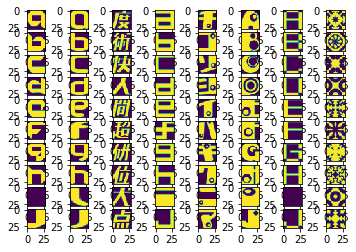

In [13]:
#Problem2 Displaying a sample of the labels and images from the ndarray

# Config the matplotlib backend as plotting inline in IPython
%matplotlib inline
import matplotlib.pyplot as plt
def load_and_displayImage_from_pickle(data_filename_set,NumClass,NumImage):
    if(NumImage <= 0):
        print('NumImage <= 0')
        return
    plt.figure('subplot')
    for index,pickle_file in enumerate(data_filename_set):
        with open(pickle_file,'rb') as f:
            data = pickle.load(f)
            ImageList = data[0:NumImage,:,:]
            for i,Image in enumerate(ImageList):
                #NumClass代表类别，每个类别一行;NumImage代表每个类显示的图像张数
                plt.subplot(NumClass, NumImage, index*NumImage+i+1)
                plt.imshow(Image)
            index = index+1        
#显示10类，每类显示5张图片        
load_and_displayImage_from_pickle(train_datasets,10,8)    
#load_and_displayImage_from_pickle(test_datasets,10,6) 


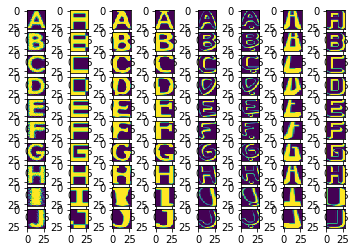

In [16]:
load_and_displayImage_from_pickle(test_datasets,10,8) 

# 问题3-检测数据是否平衡
数据是否平衡的意思是各类样本的大小是否相当。

train_datasets:

52909
52911
52912
52911
52912
52912
52912
52912
52912
52911


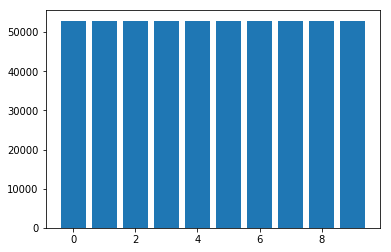

test_datasets:

1872
1873
1873
1873
1873
1872
1872
1872
1872
1872


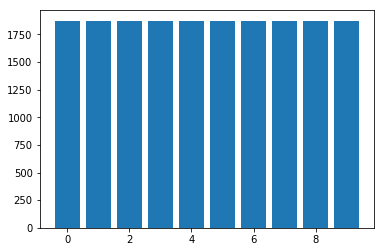

In [17]:
def show_sum_of_different_class(data_filename_set):
    plt.figure(1)
    #read .pickle file
    sumofdifferentclass = []
    for pickle_file in data_filename_set:
        with open(pickle_file,'rb') as f:
            data = pickle.load(f)
            print(len(data))
            sumofdifferentclass.append(len(data))

    #show the data
    x = range(10)
    plt.bar(x,sumofdifferentclass)    
    plt.show()

print('train_datasets:\n')    
show_sum_of_different_class(train_datasets)  
print('test_datasets:\n')    
show_sum_of_different_class(test_datasets) 


In [18]:
def make_arrays(nb_rows, img_size):
  if nb_rows:
    dataset = np.ndarray((nb_rows, img_size, img_size), dtype=np.float32)
    labels = np.ndarray(nb_rows, dtype=np.int32)
  else:
    dataset, labels = None, None
  return dataset, labels

def merge_datasets(pickle_files, train_size, valid_size=0):
  num_classes = len(pickle_files)
  valid_dataset, valid_labels = make_arrays(valid_size, image_size)
  train_dataset, train_labels = make_arrays(train_size, image_size)
  vsize_per_class = valid_size // num_classes
  tsize_per_class = train_size // num_classes
    
  start_v, start_t = 0, 0
  end_v, end_t = vsize_per_class, tsize_per_class
  end_l = vsize_per_class+tsize_per_class
  for label, pickle_file in enumerate(pickle_files):       
    try:
      with open(pickle_file, 'rb') as f:
        letter_set = pickle.load(f)
        # let's shuffle the letters to have random validation and training set
        np.random.shuffle(letter_set)
        if valid_dataset is not None:
          valid_letter = letter_set[:vsize_per_class, :, :]
          valid_dataset[start_v:end_v, :, :] = valid_letter
          valid_labels[start_v:end_v] = label
          start_v += vsize_per_class
          end_v += vsize_per_class
                    
        train_letter = letter_set[vsize_per_class:end_l, :, :]
        train_dataset[start_t:end_t, :, :] = train_letter
        train_labels[start_t:end_t] = label
        start_t += tsize_per_class
        end_t += tsize_per_class
    except Exception as e:
      print('Unable to process data from', pickle_file, ':', e)
      raise
    
  return valid_dataset, valid_labels, train_dataset, train_labels
            
            
train_size = 200000
valid_size = 10000
test_size = 10000

valid_dataset, valid_labels, train_dataset, train_labels = merge_datasets(
  train_datasets, train_size, valid_size)
_, _, test_dataset, test_labels = merge_datasets(test_datasets, test_size)

print('Training:', train_dataset.shape, train_labels.shape)
print('Validation:', valid_dataset.shape, valid_labels.shape)
print('Testing:', test_dataset.shape, test_labels.shape)

Training: (200000, 28, 28) (200000,)
Validation: (10000, 28, 28) (10000,)
Testing: (10000, 28, 28) (10000,)


In [19]:
def randomize(dataset, labels):
  permutation = np.random.permutation(labels.shape[0])
  shuffled_dataset = dataset[permutation,:,:]
  shuffled_labels = labels[permutation]
  return shuffled_dataset, shuffled_labels
train_dataset, train_labels = randomize(train_dataset, train_labels)
test_dataset, test_labels = randomize(test_dataset, test_labels)
valid_dataset, valid_labels = randomize(valid_dataset, valid_labels)

# 问题4 从验证混合后的数据

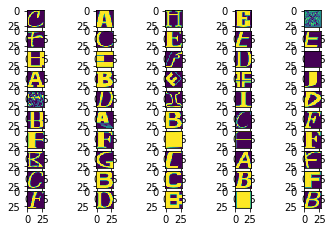

In [20]:
'''Problem4 Convince yourself that the data is still good after shuffling!
'''
#data_set是数据集，NumImage是显示的图像张数
def displayImage_from_dataset(data_set,NumImage):
    if(NumImage <= 0):
        print('NumImage <= 0')
        return
    plt.figure('subplot')
    ImageList = data_set[0:NumImage,:,:]
    for index,Image in enumerate(ImageList):
        #NumClass代表类别，每个类别一行;NumImage代表每个类显示的图像张数
        plt.subplot(NumImage//5+1, 5, index+1)
        plt.imshow(Image)
        index = index+1    
    plt.show()
displayImage_from_dataset(train_dataset,50)  

In [ ]:
#将不同的样本及存为.pickle文件

In [21]:
data_root = 'G:/github/lesson9/data/sample_data/' # Change me to store data elsewhere

print(data_root)
pickle_file = os.path.join(data_root, 'notMNIST.pickle')
print(pickle_file)

try:
  f = open(pickle_file, 'wb')
  save = {
    'train_dataset': train_dataset,
    'train_labels': train_labels,
    'valid_dataset': valid_dataset,
    'valid_labels': valid_labels,
    'test_dataset': test_dataset,
    'test_labels': test_labels,
    }
  pickle.dump(save, f, pickle.HIGHEST_PROTOCOL)
  f.close()
except Exception as e:
  print('Unable to save data to', pickle_file, ':', e)
  raise


G:/github/lesson9/data/sample_data/
G:/github/lesson9/data/sample_data/notMNIST.pickle


# 问题5-数据清洗
一般来说，训练集、验证集和测试集中会有数据的重合，但是，如果重合的数据太多则会影响到测试结果的准确程度。因此，需要对数据进行清洗，使彼此之间步存在交集。
注：ndarray数据无法使用set的方式来求取交集。但如果使用循环对比的方式在数据量大的情况下会非常慢，因此，下文的做法使先将数据哈希化，再通过哈希的键值来判断数据是否相等。由于哈希的键值是字符串，因此比对起来效率会高很多。

Number of overlaps: 1275


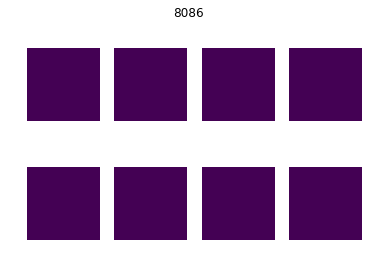

Overlapping images removed from test_dataset:  1275
Overlapping images removed from valid_dataset:  1013
Training: (200000, 28, 28) (200000,)
Validation: (8987,) (8987,)
Testing: (8725, 28, 28) (8725,)
Compressed pickle size: 690800506


In [22]:
#先使用hash
import hashlib

#使用sha的作用是将二维数据和哈希值之间进行一一对应，这样，通过比较哈希值就能将二维数组是否相等比较出来
def extract_overlap_hash_where(dataset_1,dataset_2):

    dataset_hash_1 = np.array([hashlib.sha256(img).hexdigest() for img in dataset_1])
    dataset_hash_2 = np.array([hashlib.sha256(img).hexdigest() for img in dataset_2])
    overlap = {}
    for i, hash1 in enumerate(dataset_hash_1):
        duplicates = np.where(dataset_hash_2 == hash1)
        if len(duplicates[0]):
            overlap[i] = duplicates[0]
    return overlap

#display the overlap 去掉重叠的
def display_overlap(overlap,source_dataset,target_dataset):
    overlap = {k: v for k,v in overlap.items() if len(v) >= 3}
    item = np.random.choice(list(overlap.keys()))
    imgs = np.concatenate(([source_dataset[item]],target_dataset[overlap[item][0:7]]))
    plt.suptitle(item)
    for i,img in enumerate(imgs):
        plt.subplot(2,4,i+1)
        plt.axis('off')
        plt.imshow(img)
    plt.show()

#数据清洗
def sanitize(dataset_1,dataset_2,labels_1):
    dataset_hash_1 = np.array([hashlib.sha256(img).hexdigest() for img in dataset_1])
    dataset_hash_2 = np.array([hashlib.sha256(img).hexdigest() for img in dataset_2])
    overlap = []
    for i,hash1 in enumerate(dataset_hash_1):
        duplictes = np.where(dataset_hash_2 == hash1)
        if len(duplictes[0]):
            overlap.append(i)
    return np.delete(dataset_1,overlap,0),np.delete(labels_1, overlap, None)


overlap_test_train = extract_overlap_hash_where(test_dataset,train_dataset)
print('Number of overlaps:', len(overlap_test_train.keys()))
display_overlap(overlap_test_train, test_dataset, train_dataset)

test_dataset_sanit,test_labels_sanit = sanitize(test_dataset,train_dataset,test_labels)
print('Overlapping images removed from test_dataset: ', len(test_dataset) - len(test_dataset_sanit))

valid_dataset_sanit, valid_labels_sanit = sanitize(valid_dataset, train_dataset, valid_labels)
print('Overlapping images removed from valid_dataset: ', len(valid_dataset) - len(valid_dataset_sanit))

print('Training:', train_dataset.shape, train_labels.shape)
print('Validation:', valid_labels_sanit.shape, valid_labels_sanit.shape)
print('Testing:', test_dataset_sanit.shape, test_labels_sanit.shape)

pickle_file_sanit = data_root + 'notMNIST_sanit.pickle'
try:
    f = open(pickle_file_sanit,'wb')
    save = {
        'train_dataset':train_dataset,
        'train_labels': train_labels,
        'valid_dataset': valid_dataset,
        'valid_labels': valid_labels,
        'test_dataset': test_dataset,
        'test_labels': test_labels,
    }
    pickle.dump(save,f,pickle.HIGHEST_PROTOCOL)
    f.close()
except Exception as e:
  print('Unable to save data to', pickle_file, ':', e)
  raise

statinfo = os.stat(pickle_file_sanit)
print('Compressed pickle size:', statinfo.st_size)

# 问题6-模型训练
该模型是使用逻辑回归模型进行的训练。

In [27]:
def train_and_predict(sample_size):
    regr = LogisticRegression()
    X_train = train_dataset[:sample_size].reshape(sample_size,784)
    y_train = train_labels[:sample_size]
    regr.fit(X_train,y_train)
    X_test = test_dataset.reshape(test_dataset.shape[0],28*28)
    y_test = test_labels

    pred_labels = regr.predict(X_test)
    print('Accuracy:', regr.score(X_test, y_test), 'when sample_size=', sample_size)

for sample_size in [50,100,1000,5000]:
    train_and_predict(sample_size)


g:\Anaconda\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
g:\Anaconda\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
g:\Anaconda\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
g:\Anaconda\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)


Accuracy: 0.554 when sample_size= 50
Accuracy: 0.7254 when sample_size= 100


g:\Anaconda\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
g:\Anaconda\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)


Accuracy: 0.8436 when sample_size= 1000


g:\Anaconda\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
g:\Anaconda\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)


Accuracy: 0.8511 when sample_size= 5000
